<img src="./img/cabecera.png" style="height: 200px">
<center style="color:#888">
<br/><br/><b/>Implementación clusterización y modelo alternativo SEMI-SUPERVISADO</center>


### Objetivo

* El objetivo de este worksheet, es dar respuesta al punto 2 de la prueba técnica, en la que se nos solicita que se monte un módelo basado en clusterización, para ver como de bien o mal nos clsifica un dataset de imagenes, en el que el objetivos sería clasificar de forma adecuada imagenes de girasoles y rosas.
* Por otro lado hay otra parte en la que se ha implementado un modelo alternativo al de clusterización que es la utilización de un modelo Semi-Supervisado.

### Preparación de entorno

In [1]:
%matplotlib inline

from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import rcParams
rcParams['figure.figsize'] = (14, 7)
rcParams.update({'font.size': 14})
import imageio
from skimage import data, io, filters, img_as_ubyte
from skimage.color import rgb2gray
from skimage.transform import rescale, resize, downscale_local_mean
import glob


### Preprocesamiento de imagenes y captura de las features

* En esta parte pasamos a recoger todas las imagenes y las preprocesamos, para que nos la deje en un tamaño dee 64x64 y las aplanamos a un array de una dimensión para que pueda ser tratado por los algoritmos. Si seguimos respetando los 3 canales de colores, por que creo que para esta clasificación el color es importante,aunque claro esta esto penaliza el rendimiento de los modelos a la hora de realizar la clasificación.

In [2]:
PATH='./technical_test_images\\'

In [3]:
# Funciones que nos permite aplanar y recomponer la estructura del array de la imagen.
image_size_h = 64
image_size_w = 64
channels = 3
def flatten(imag):
    vec = np.reshape(imag, (image_size_h*image_size_w*channels))
    return vec
def unflatten(vec):
    imag = np.reshape(vec, (-1, image_size_h, image_size_w))
    return imag

(64, 64, 3)
[0.36078431 0.34117647 0.3254902  ... 0.23676471 0.23676471 0.22892157]
(12288,)


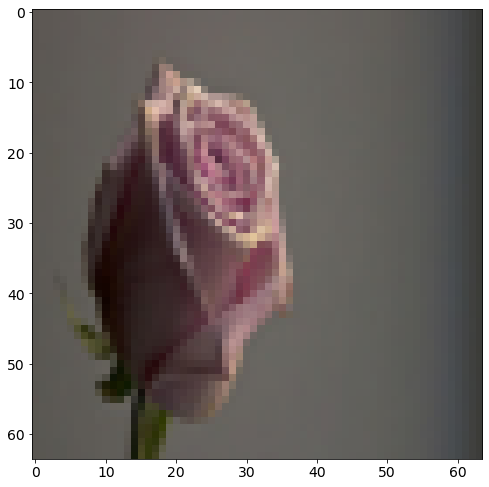

In [4]:
img = io.imread(PATH+"imagen1.jpg")
img_64=resize(img,(image_size_h,image_size_w),anti_aliasing=True)
print(img_64.shape)
img_64_flatten= flatten(img_64)
print(img_64_flatten)
print(img_64_flatten.shape)
io.imshow(img_64)
io.show()

In [5]:
lista_ficheros=[]
images=[]
for img_file in glob.glob(PATH+'*.jp*'):
    lista_ficheros.append(img_file)
    img = io.imread(img_file)
    img_64=resize(img,(image_size_h,image_size_w),anti_aliasing=True)
    img_64_flatten= flatten(img_64)
    images.append(img_64_flatten)
    
images_X=np.asarray(images)
print(images_X.shape)

(1576, 12288)


In [6]:
images_X[0]

array([0.36078431, 0.34117647, 0.3254902 , ..., 0.23676471, 0.23676471,
       0.22892157])

### Reducción de Features 

#### PCA

* Debido a que las features de cada imagen es alto, ya que consideramos los pixels, y que pese a la reducción de tamaño contamos con 12288 features por imagen, vamos a proceder a pasar a un proceso de reducción de features. Para ello vamos a optar por dos opcines, o usamos una u otra, pero he querido reflejarlas. Las opciones serían:
    * PCA: Anlisis de componentes principales. Genera de forma sintetica unas variables, que son agragación de las features originales.
    * TSNE: t-distributed stochastic neighbor embedding. Hace una función similar a PCA pero no es lineal por lo que puede explorar nuevas posibilidas a diferencia de PCA.

In [7]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

In [8]:
pca=PCA(n_components=100)
pca.fit(images_X)
dataset_X_PCA=pca.transform(images_X)

In [9]:
print(images_X.shape)
print(dataset_X_PCA.shape)

(1576, 12288)
(1576, 100)


#### TSNE

In [10]:
from sklearn.manifold import TSNE

tsne = TSNE(random_state=42)
dataset_X_tsne = tsne.fit_transform(images_X)

In [11]:
print(images_X.shape)
print(dataset_X_tsne.shape)

(1576, 12288)
(1576, 2)


In [12]:
dataset_X_tsne

array([[ -4.8996425,  -8.967018 ],
       [  5.8062506, -31.554255 ],
       [-16.46435  ,   9.446718 ],
       ...,
       [ -1.6812999,  -6.791829 ],
       [ -5.69418  ,  -6.5636377],
       [  1.0489362,  21.758081 ]], dtype=float32)

### Clusterización

* Una vez que se ha generado un dataset con reducción de features, pasamos al propio proceso de clusterización, utilizando los algorimos nos supervisados de K-Means, uno de los más utilizados, DBSCAN, SpectralClustering.
* Por otro lado en esta sección utilizamos la técnica del codo, para en el caso de KMeans ver que número de cluster es ideal, ya que uno de los parámetros de este algorítmo es el n_cluster, que es el número de cluster a clasificar. Para DBSCAN, no hace falta ya que es el propio algoritmo de DBSCAN el que encuentra los cluster. Si es cierto que hay que jugar con otros parámetros. Tal vez habría que haberlos ajustado con algún proceso de hiperparametrización.
* También pasamos a hacer un proceso de standarización de los datos para que el algoritmo trabaje de forma más fina y los datos esten con la misma referencia.

#### K-Means

In [13]:
from sklearn.cluster import KMeans

In [14]:
# Reescalamos los valores para que el clasificador pueda trabajar de mejor forma.
ss=StandardScaler()
X_reescalado = ss.fit_transform(dataset_X_tsne)
X_reescalado

array([[-0.35905352, -0.5463693 ],
       [ 0.4993304 , -1.8917884 ],
       [-1.286296  ,  0.5504533 ],
       ...,
       [-0.10101119, -0.41680318],
       [-0.42275846, -0.40321085],
       [ 0.11789542,  1.2837852 ]], dtype=float32)

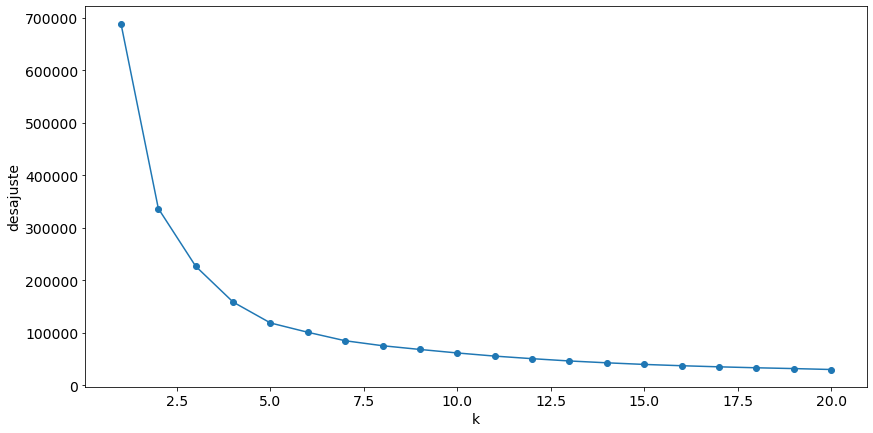

In [15]:
desajuste = []
for i in range(1, 21):
    km = KMeans(n_clusters=i,init='k-means++', random_state=42)
    km.fit(dataset_X_tsne)
    desajuste.append(km.inertia_)#inertia es como de lejos estan sepàrados los puntos de los centroides

plt.plot(range(1, 21), desajuste, marker='o')
plt.xlabel('k')
plt.ylabel('desajuste')
plt.show()

In [16]:
#Lanzamos el clasificador con el algoritmo de K-Means
from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters=10, init='k-means++',random_state=42)
labels_KMeans = kmeans.fit_predict(X_reescalado)
labels_KMeans


array([9, 0, 4, ..., 9, 9, 8])

In [17]:
# Visualizamos el valor de los centroides que han permitido hacer los grupos.
centroides_KMeans=kmeans.cluster_centers_
centroides_KMeans

array([[ 0.38758165, -1.633527  ],
       [-0.6984703 ,  1.2424077 ],
       [ 0.33672857,  0.42614266],
       [ 1.4895333 ,  0.2342743 ],
       [-1.7326738 ,  1.0111533 ],
       [-0.8589702 ,  0.03359183],
       [ 0.6646484 , -0.42925766],
       [ 1.1801486 , -1.2352428 ],
       [ 0.2001631 ,  1.3728828 ],
       [-0.40823153, -0.74578035]], dtype=float32)

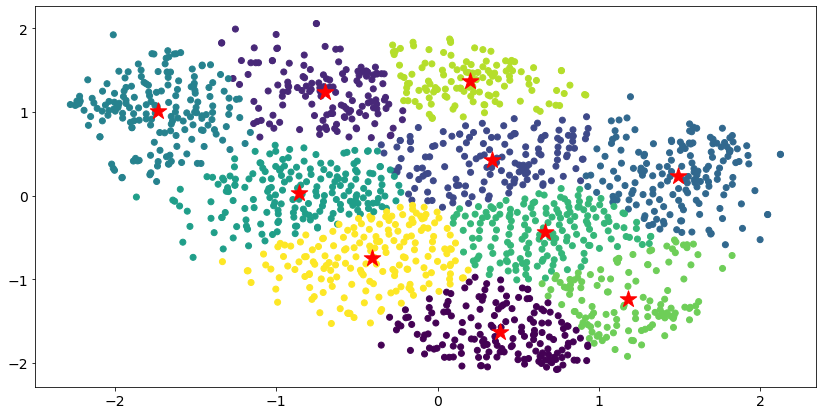

In [18]:
# Hacemos una simple visualización para ver como quedan siturados los centroides con respcto a los puntos, que serían
# las imagenes clasificadas.

plt.scatter(X_reescalado[:, 0], X_reescalado[:, 1], c=labels_KMeans);
plt.scatter(centroides_KMeans[:,0], centroides_KMeans[:,1],s=300,c='red', marker='*');

* Observamos que la nube de puntos, en el que cada punto es una imagen, es una nuebe continua de puntos, aunque hay imagenes que si están muy cercanos a los centroides y tal vez estas imagenes sean las que mejor claisficadas esten.

In [19]:
# Función que nos permite cruzar las etiquetas o cluster con las imagenes.
def crea_grupos(lista_ficheros,labels):

    grupos = {}
    for fichero, cluster in zip(lista_ficheros,labels):
        if cluster not in grupos.keys():
            grupos[cluster] = []
            grupos[cluster].append(fichero)
        else:
            grupos[cluster].append(fichero)
    return grupos


def visualiza_grupos(grupos,texto_etiquetas={}):
    # Función que visualiza las imagenes para cada agrupación
    for cluster in grupos.keys():
        if(texto_etiquetas!={}):
            print(f'Grupo: {texto_etiquetas.get(cluster)}')    
        else:
            print(f'Grupo: {cluster}')
        files = grupos[cluster]
        if len(files) > 25:
            print(f"Mostramos 25 imagenes de un grupo de {len(files)}")
            files = files[:25]
        # Visualizamos las imagenes para cada cluster.
        print(f'Visualizamos')
        for index, file in enumerate(files):
            plt.subplot(5,5,index+1);
            img = io.imread(file)
            plt.imshow(img)
            plt.axis('off')
        plt.show();
    return 

Grupo: 9
Mostramos 25 imagenes de un grupo de 181
Visualizamos


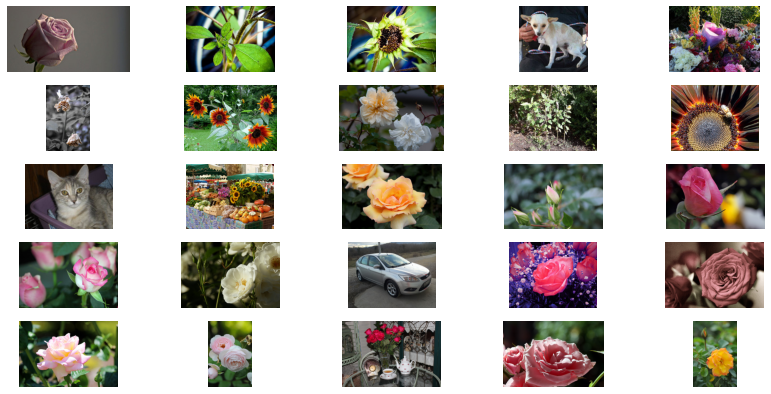

Grupo: 0
Mostramos 25 imagenes de un grupo de 167
Visualizamos


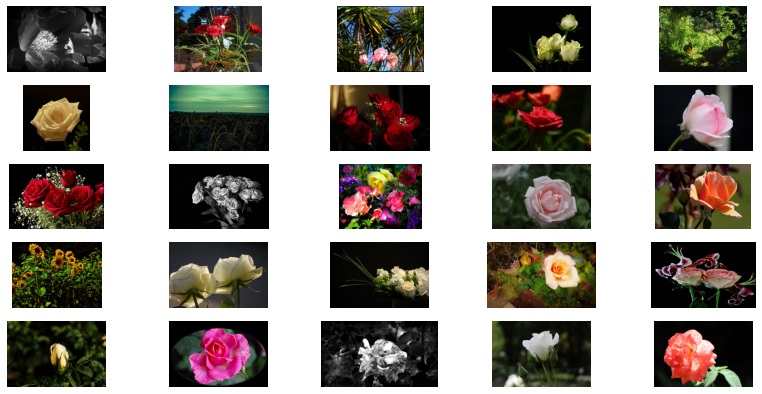

Grupo: 4
Mostramos 25 imagenes de un grupo de 179
Visualizamos


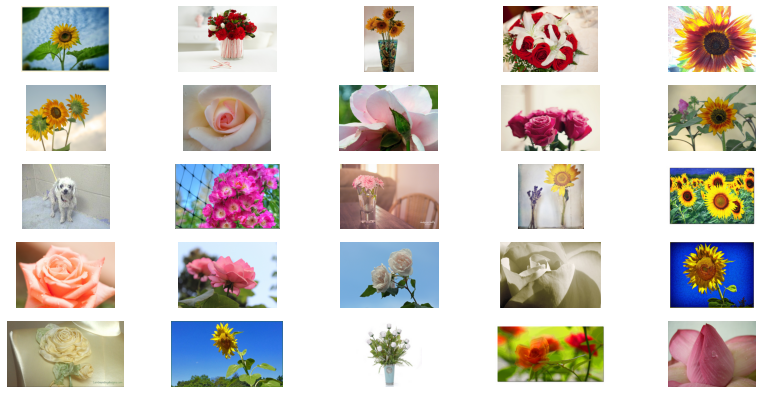

Grupo: 1
Mostramos 25 imagenes de un grupo de 138
Visualizamos


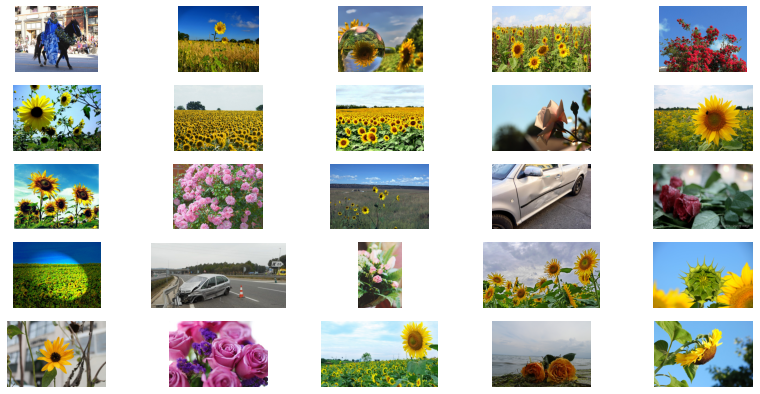

Grupo: 8
Mostramos 25 imagenes de un grupo de 123
Visualizamos


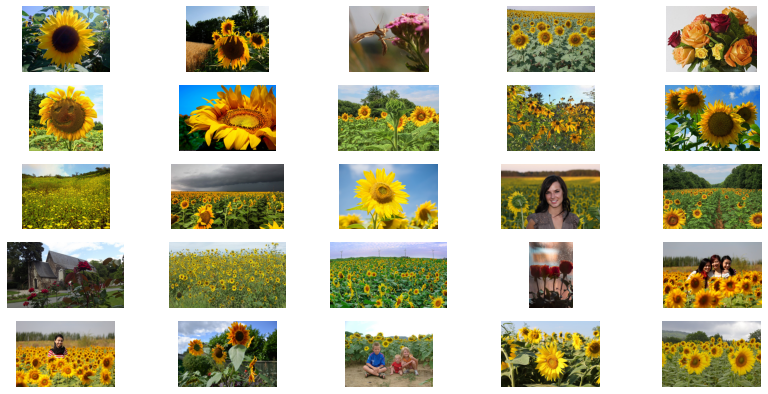

Grupo: 6
Mostramos 25 imagenes de un grupo de 167
Visualizamos


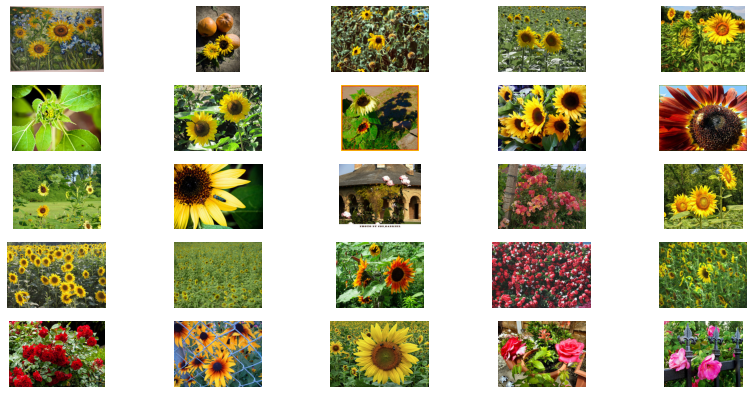

Grupo: 2
Mostramos 25 imagenes de un grupo de 146
Visualizamos


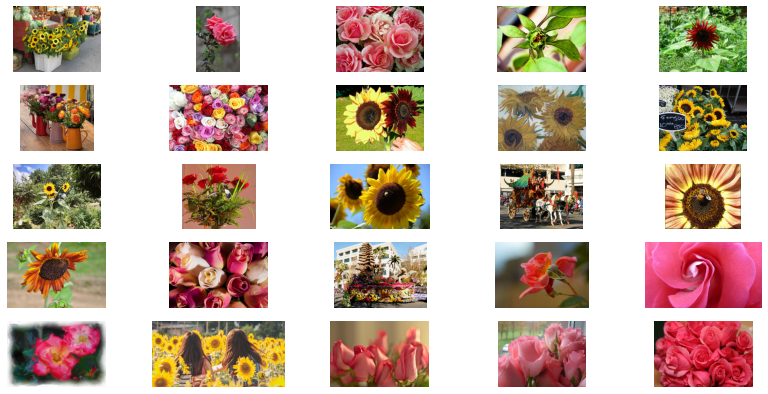

Grupo: 5
Mostramos 25 imagenes de un grupo de 187
Visualizamos


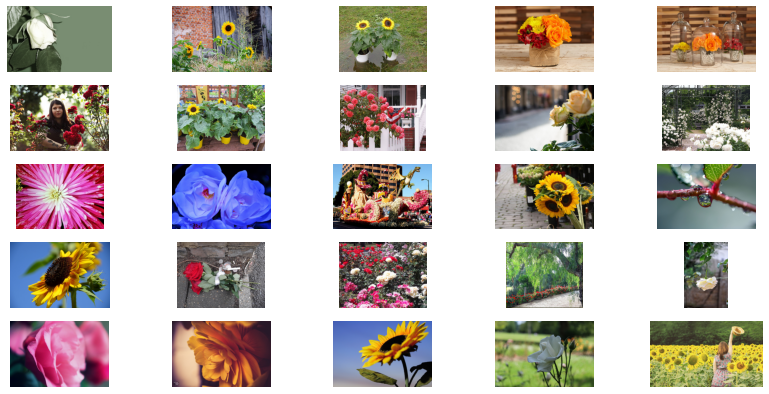

Grupo: 3
Mostramos 25 imagenes de un grupo de 166
Visualizamos


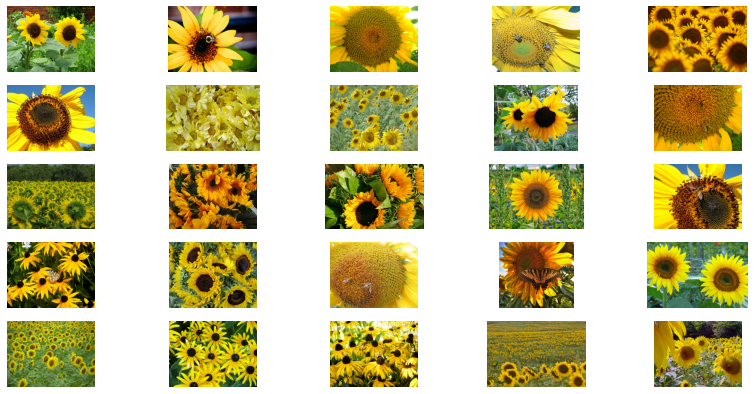

Grupo: 7
Mostramos 25 imagenes de un grupo de 122
Visualizamos


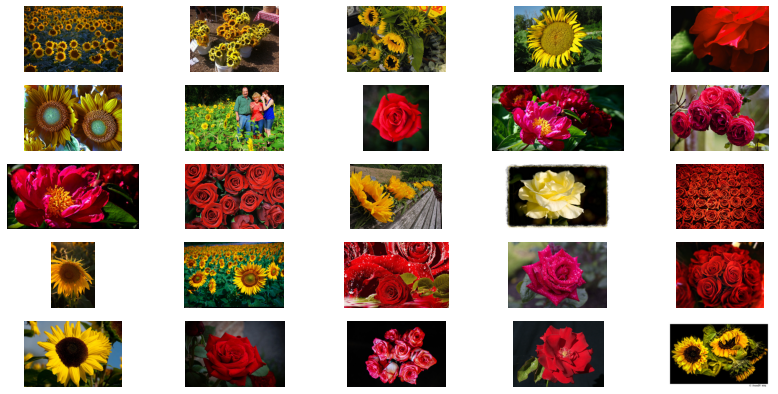

In [20]:
grupos_KMeans = crea_grupos(lista_ficheros,labels_KMeans)
visualiza_grupos(grupos_KMeans)

#### DBSCAN

In [21]:
from sklearn.cluster import DBSCAN
from sklearn import metrics
dbscan = DBSCAN(eps=0.5, min_samples = 100)
labels_DBSCAN = dbscan.fit_predict(X_reescalado)

In [22]:
labels_DBSCAN

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [23]:
# numero de clusters en etiquetas, ignorando el ruido presente.
n_clusters_ = len(set(labels_DBSCAN)) - (1 if -1 in labels_DBSCAN else 0)
n_noise_ = list(labels_DBSCAN).count(-1)

print('Número estimado de clusters: %d' % n_clusters_)
print('Número estimado de puntos ruidosos: %d' % n_noise_)


Número estimado de clusters: 2
Número estimado de puntos ruidosos: 35


Grupo: 0
Mostramos 25 imagenes de un grupo de 1380
Visualizamos


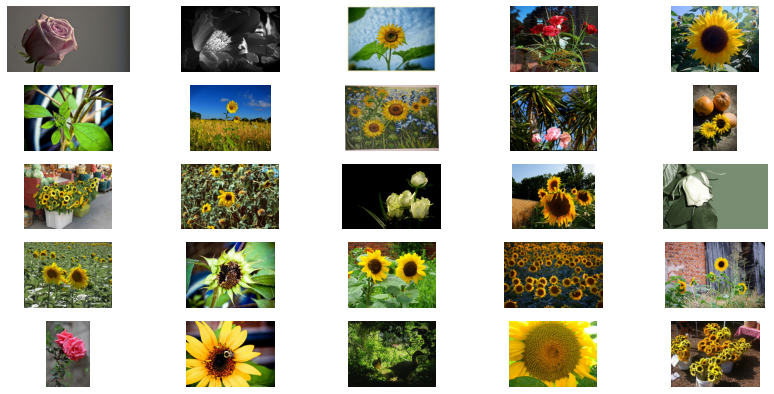

Grupo: -1
Mostramos 25 imagenes de un grupo de 35
Visualizamos


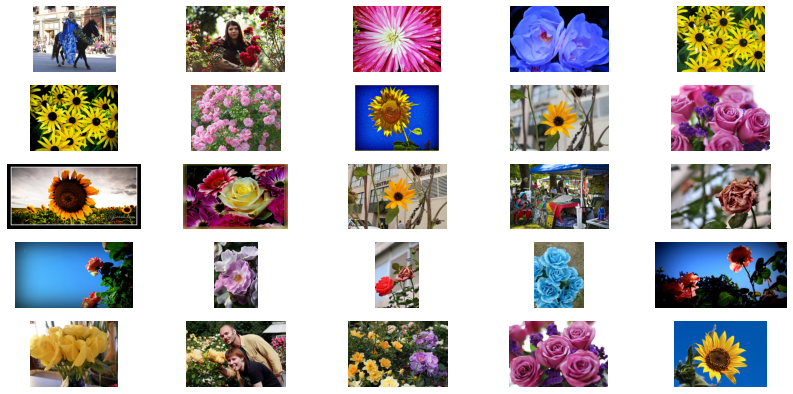

Grupo: 1
Mostramos 25 imagenes de un grupo de 161
Visualizamos


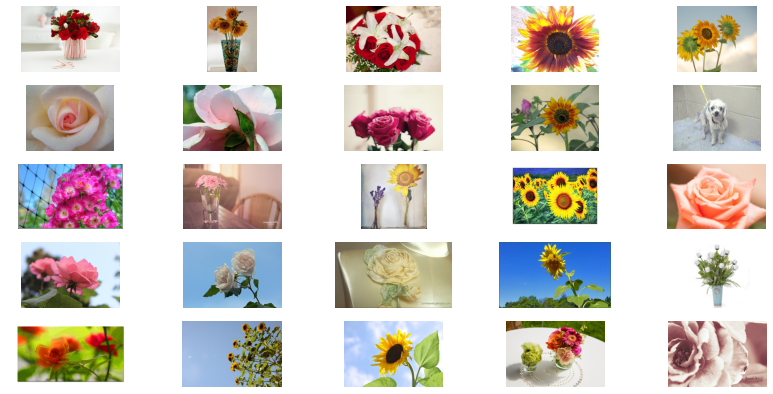

In [24]:
grupos_DBSCAN = crea_grupos(lista_ficheros,labels_DBSCAN)
visualiza_grupos(grupos_DBSCAN)

#### SpectralClustering

Grupo: 8
Mostramos 25 imagenes de un grupo de 170
Visualizamos


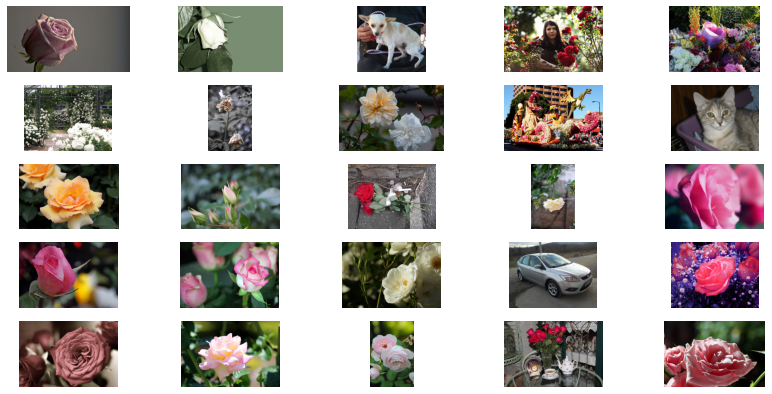

Grupo: 3
Mostramos 25 imagenes de un grupo de 150
Visualizamos


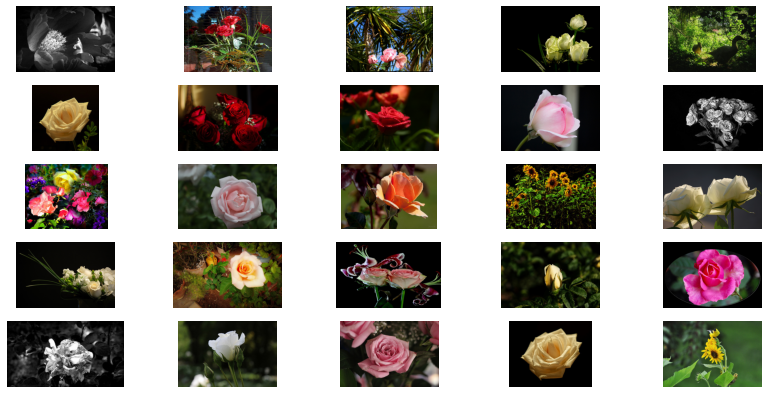

Grupo: 7
Mostramos 25 imagenes de un grupo de 139
Visualizamos


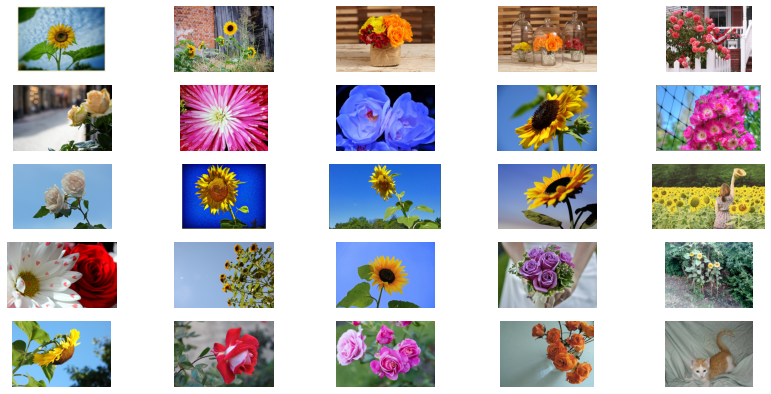

Grupo: 2
Mostramos 25 imagenes de un grupo de 155
Visualizamos


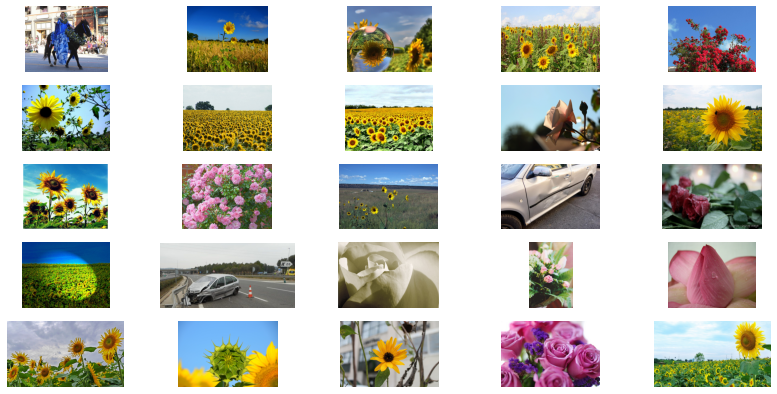

Grupo: 4
Mostramos 25 imagenes de un grupo de 130
Visualizamos


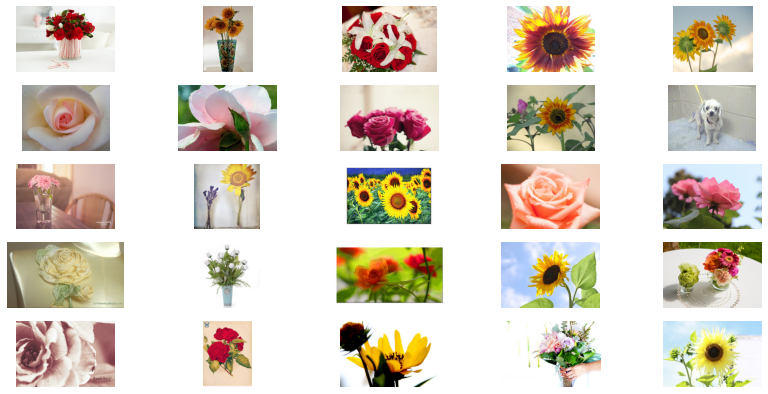

Grupo: 6
Mostramos 25 imagenes de un grupo de 136
Visualizamos


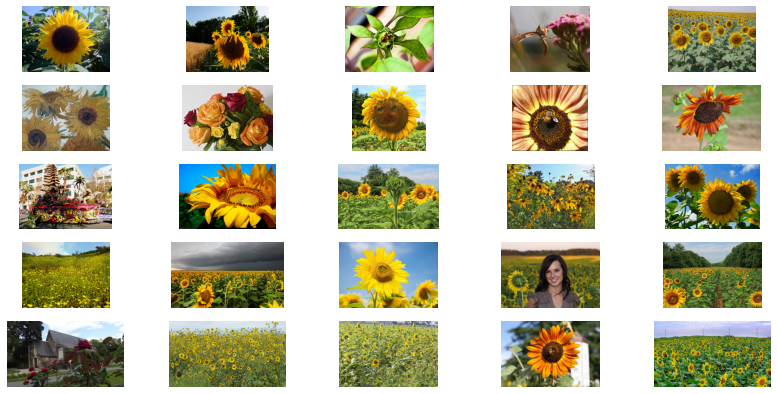

Grupo: 0
Mostramos 25 imagenes de un grupo de 230
Visualizamos


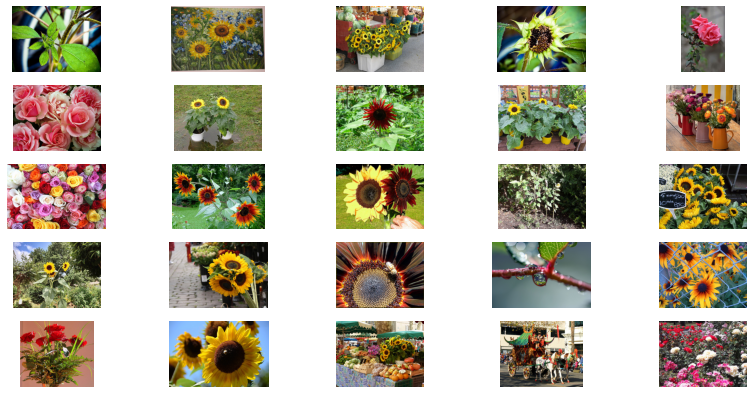

Grupo: 1
Mostramos 25 imagenes de un grupo de 229
Visualizamos


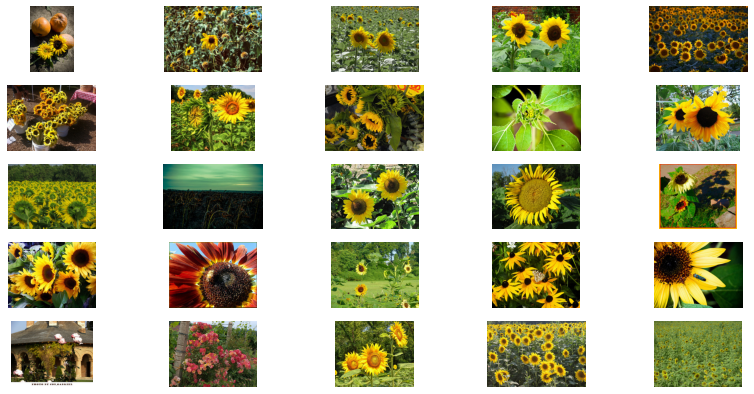

Grupo: 5
Mostramos 25 imagenes de un grupo de 139
Visualizamos


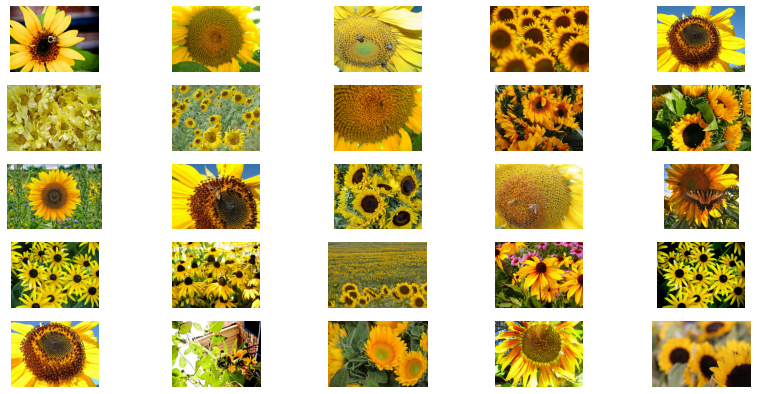

Grupo: 9
Mostramos 25 imagenes de un grupo de 98
Visualizamos


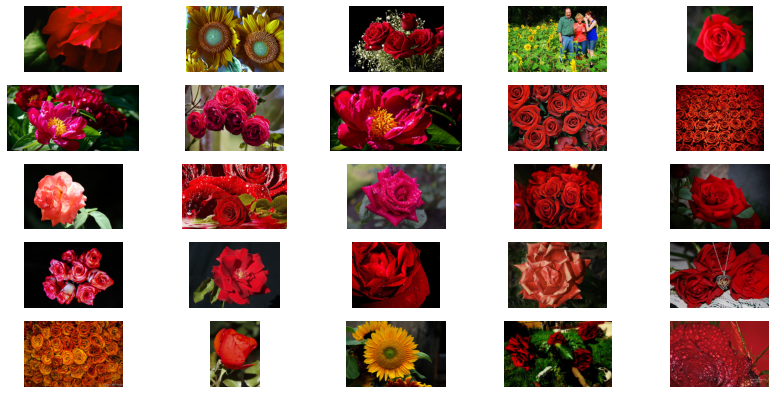

In [25]:
from sklearn.cluster import SpectralClustering
import numpy as np
clustering = SpectralClustering(n_clusters=10,
                            assign_labels='discretize',
                            random_state=0).fit(X_reescalado)
labels_SpectralClustering=clustering.labels_
grupos_SpectralClustering = crea_grupos(lista_ficheros,labels_SpectralClustering)
visualiza_grupos(grupos_SpectralClustering)

#### Conclusión

* Como conclusión a estos procesos de clustering, vemos que hay grupos que si tienen sentido en la clasificación pero otros no quedan muy claro cual es el criterio.
* Tal vez una mejor estrategia de cpatura de features, en algunas iniciativas utilizan redes del tipo CNN preenternadas como la VGG16, simplemente como meros extratores de las features. Una vez extraidas estas features, ya se pasa por el proceso de reducción de features y luego pasan por un posterior proceso de clusterización

### Alternativa a la clusterización - Modelo SEMI-SUPERVISADO

* Una alternativa a la clusterización y dado que se da la oportunidad de clasificar alguna de las imagenes es hacer una aproximación utilizando algoritmos SEMI-SUPERVISADOS. En lineas generales se utiliza un clasificador con una seríe de imagenes etiquetadas y el resto de imagenes se utiliza las etiquetas que generaría en el entrenamiento para etquetar las imagenes que están sin etiquetar.
* Para esto nos apoyamos en el algoritmo LabelSpreading de sklearn.

#### LabelSpreading

In [26]:
import numpy as np
import matplotlib.pyplot as plt

from scipy import stats
from sklearn.semi_supervised import LabelSpreading
from sklearn.metrics import confusion_matrix, classification_report


In [27]:
# Consturimos el Y con la dimensión total de las imagenes y todo a -1 que en principio indica que no esta etiquetado.
Y=np.full(X_reescalado.shape[0],-1)
Y

array([-1, -1, -1, ..., -1, -1, -1])

In [28]:
# Vamos a etiquetar las 10 imagenes que nos permiten
# 0 - girasol - imagen196.jpg, imagen203.jpg,imagen278.jpg,imagen279.jpg
# 1 - otro - imagen2.jpg,imagen30.jpg,imagen33.jpg,imagen297.jpg
# 2 - rosa - imagen11.jpg, imagen1243..jpg
# -1 - Etiqeta de no etiquetado.

lista_imagenes_etiquetar_girasol=[PATH+'imagen737.jpg', PATH+'imagen1080.jpg',PATH+'imagen1093.jpg',PATH+'imagen977.jpg']
lista_imagenes_etiquetar_rosa=[PATH+'imagen1.jpg', PATH+'imagen30.jpg',PATH+'imagen712.jpg',PATH+'imagen1401.jpg']
lista_imagenes_etiquetar_otros=[PATH+'imagen103.jpg', PATH+'imagen1243.jpg']

for imagen in lista_imagenes_etiquetar_girasol:
    Y[lista_ficheros.index(imagen)]=0
for imagen in lista_imagenes_etiquetar_rosa:
    Y[lista_ficheros.index(imagen)]=2
for imagen in lista_imagenes_etiquetar_otros:
    Y[lista_ficheros.index(imagen)]=1

In [29]:
y_train = np.copy(Y)
X_train = X_reescalado.copy()

In [30]:
y_train

array([ 2, -1, -1, ..., -1, -1, -1])

In [31]:
# from sklearn.model_selection import GridSearchCV

# params_grid = {
#     'kernel': ['knn', 'rbf'], 
#     'n_neighbors': [20, 30, 50, 80, 130,210], 
#     'gamma': [20,40]
# }

# grid_svm = GridSearchCV(
#     LabelSpreading(), 
#     param_grid=params_grid, 
#     n_jobs=4, 
#     scoring='accuracy'
# )

# grid_svm.fit(X_train, y_train.iloc[:,1])

In [32]:
# Lanzamos el modelo con el algorimo LabelSpreading
lp_model = LabelSpreading(kernel='knn',n_neighbors=120)
lp_model.fit(X_train, y_train)
predicted_labels = lp_model.transduction_
print(len(predicted_labels[predicted_labels[:]!=-1]))

1576


In [33]:
grupos_LabelSpreading = crea_grupos(lista_ficheros,predicted_labels)

Grupo: otras
Mostramos 25 imagenes de un grupo de 534
Visualizamos


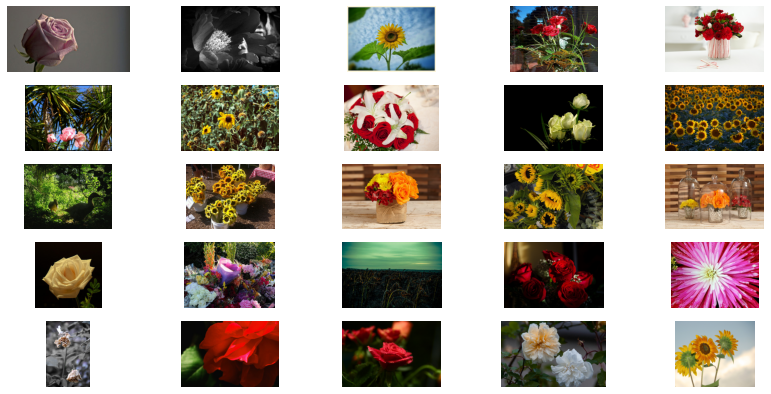

Grupo: girasol
Mostramos 25 imagenes de un grupo de 767
Visualizamos


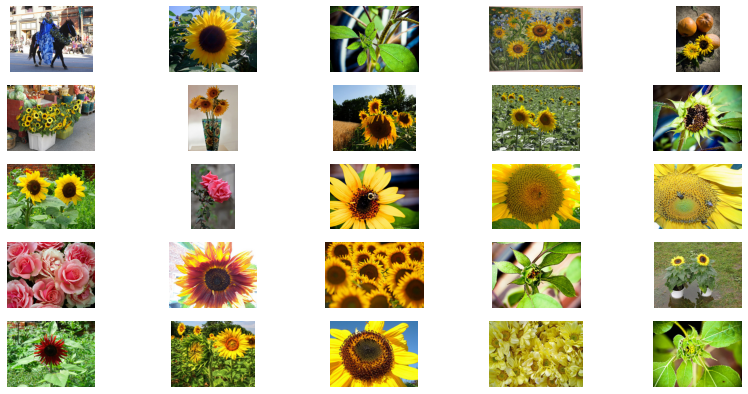

Grupo: rosa
Mostramos 25 imagenes de un grupo de 275
Visualizamos


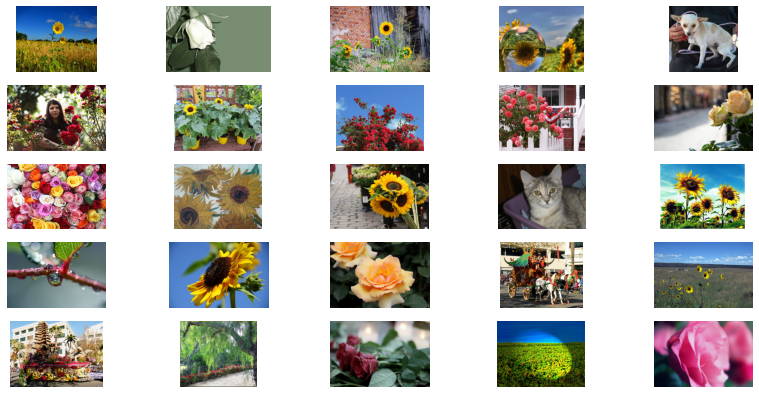

In [34]:
text_labels= { 0:'girasol', 1:'rosa', 2:'otras',-1:'no etiquetado'}
visualiza_grupos(grupos_LabelSpreading,text_labels)

### Conclusión

* Como conlcusión obervamos que el modelo ha sido capaz de etiquetar el total de las imagenes, y que ha tenido acierto en numerosos casos.
* Tal vez habría que realizar este proceso de nuevas, identificando las imagenes bien clasificadas, engrosando el número de imagenes clasificadas o eiquetasdas, y aquellas que no quedaron bien se volverían a dejar sin etiqueta para volver a pasarlas por el modelo y ver si ya quedan correctamente etiquetadas.